In [1]:
import pandas as pd
import json

import numpy as np
import pickle
from datetime import datetime
import os
import glob


In [2]:
#ntlk stopwords with a few others that I noticed that went up to the top

import nltk
from nltk.corpus import stopwords
staph = stopwords.words('english')
staph.append("like")
staph.append("got")
staph.append("get")
staph.append("know")
staph.append("aint")
staph.append("dont")
staph.append("go")

In [3]:
def process_staging():
    # Processes all new data in staging folder
    # Spits out to processed folder

    print("Process Staging Data Begin")
    path = '/Users/matthewhwang/Galvanize/Capstone1/What-We-Talkin-Bout/data/Discographies/_Mastered_Cleaned'
    files = [f for f in glob.glob(path + "**/*.txt")]
    all_words = []
    for each in files:
        with open(each, 'r') as f:
            contents = json.load(f)["Discography"]
            for song in contents:
                for words in song["lyrics"].split():
                    all_words.append(words.lower())
    print("Finished")
    return all_words

In [4]:
corpus = process_staging()

Process Staging Data Begin
Finished


In [5]:
len(corpus)

1972066

In [13]:
biggie = ' '.join(word for word in corpus)

In [14]:
biggie

'yo you know what i want i want the beat to drop rightnow niggas be thinkin im crazy right you are crazy i aint crazy you are crazy at least i dont think im crazy i think my shit is hot i think im hot you hot but you crazy why they wannamani dont know its the money that - makes shit get ugly its the money that - makes these hoes love me its the money that - makes niggas wanna slug me mani thought the money would make it all lovely yo i actually write what i do or see the felonies from day to day make me say what i say when i die my art will be worth more than picassos dont cry for me smile for me and if you see them niggas that wet me wile for me remember the good times the chips we stacked the clips we packed and all the bricks we cooked from coke to crack let my tombstone read i tried and from the start everything i wrote was from my heart so itll always be number one on my chart i get sensitive with my shit dont fuck with my art sometimes it sounds like im playin but im sayin this s

In [16]:
import matplotlib.pyplot as plt

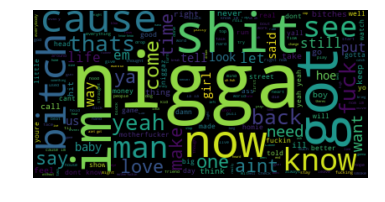

In [17]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# Start with one review:
text = biggie

# Create and generate a word cloud image:
wordcloud = WordCloud().generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [59]:
from sklearn.feature_extraction.text import CountVectorizer

tf = CountVectorizer()

document_tf_matrix = tf.fit_transform(corpus).todense()

print(sorted(tf.vocabulary_))
print(document_tf_matrix)

['000', '007', '02', '03', '04', '05', '06', '07', '08', '09', '0s', '10', '100', '1000', '10000', '100000', '1001', '100gs', '100k', '100s', '100th', '101', '1017s', '101s', '102', '103', '1030', '105', '106', '106th', '1099', '10c', '10deep', '10ft', '10k', '10ll', '10s', '10th', '11', '110', '11047986', '111', '112', '1126', '1130', '113th', '115', '1159', '1199', '11s', '11th', '12', '120', '122nd', '123', '1230', '1234', '125', '125000', '12am', '12play', '12s', '12th', '13', '134', '13s', '13th', '13ths', '14', '140', '14s', '14th', '15', '1500', '150k', '151', '15s', '15th', '16', '160', '165', '16s', '16th', '17', '170', '175', '1799', '17th', '18', '180', '1800', '1800s', '1825', '1831', '183rd', '1864', '1865', '187', '1874', '187s', '18th', '19', '1928', '1929', '195', '1950s', '1965', '1970', '1977', '1980', '1982', '1985', '1987', '1992', '1993', '1995', '1996', '1998', '1999', '1999s', '19th', '1dbs', '1o', '1oo', '1s', '1st', '1x', '20', '200', '2000', '20000', '200000',

In [ ]:
from math import log

def idf(frequency_matrix):
    df =  float(len(document_tf_matrix)) / sum(frequency_matrix > 0)
    return [log(i) for i in df.getA()[0]]
print(sorted(tf.vocabulary_))
print(idf(document_tf_matrix))

['000', '007', '02', '03', '04', '05', '06', '07', '08', '09', '0s', '10', '100', '1000', '10000', '100000', '1001', '100gs', '100k', '100s', '100th', '101', '1017s', '101s', '102', '103', '1030', '105', '106', '106th', '1099', '10c', '10deep', '10ft', '10k', '10ll', '10s', '10th', '11', '110', '11047986', '111', '112', '1126', '1130', '113th', '115', '1159', '1199', '11s', '11th', '12', '120', '122nd', '123', '1230', '1234', '125', '125000', '12am', '12play', '12s', '12th', '13', '134', '13s', '13th', '13ths', '14', '140', '14s', '14th', '15', '1500', '150k', '151', '15s', '15th', '16', '160', '165', '16s', '16th', '17', '170', '175', '1799', '17th', '18', '180', '1800', '1800s', '1825', '1831', '183rd', '1864', '1865', '187', '1874', '187s', '18th', '19', '1928', '1929', '195', '1950s', '1965', '1970', '1977', '1980', '1982', '1985', '1987', '1992', '1993', '1995', '1996', '1998', '1999', '1999s', '19th', '1dbs', '1o', '1oo', '1s', '1st', '1x', '20', '200', '2000', '20000', '200000',

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer()
document_tfidf_matrix = tfidf.fit_transform(corpus)
print(sorted(tfidf.vocabulary_))
print(document_tfidf_matrix.todense())

In [19]:
import os               # for environ variables in Part 3
from nlp_pipeline import extract_bow_from_raw_text
import json

docs = []
with open('./reviews.json', 'r') as data_file:    
    for line in data_file:
        docs.append(json.loads(line))

# extracting bows
bows = list(map(lambda row: extract_bow_from_raw_text(row['reviewText']), docs))

# displaying bows
for i in range(len(docs)):
    print("\n--- review: {}".format(docs[i]['reviewText']))
    print("--- bow: {}".format(bows[i]))

FileNotFoundError: [Errno 2] No such file or directory: './reviews.json'